In [1]:
! git clone https://github.com/Daino666/udacitySim_Behavioral_Cloning_Model.git

Cloning into 'udacitySim_Behavioral_Cloning_Model'...
remote: Enumerating objects: 29553, done.
remote: Counting objects: 100% (4/4), done.
remote: Compressing objects: 100% (4/4), done.
remote: Total 29553 (delta 0), reused 2 (delta 0), pack-reused 29549 (from 2)
Receiving objects: 100% (29553/29553), 508.32 MiB | 27.45 MiB/s, done.
Resolving deltas: 100% (37/37), done.
Updating files: 100% (29521/29521), done.


In [2]:
!ls

sample_data  udacitySim_Behavioral_Cloning_Model


In [4]:
!pip install numpy==1.26.0

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 948.0/948.0 kB 16.5 MB/s eta 0:00:00


In [1]:
import os
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Convolution2D, MaxPooling2D, Dense, Dropout, Flatten, Input
from tensorflow.keras.optimizers import Adam
from sklearn.model_selection import train_test_split
from imgaug import augmenters as iaa
import cv2
from sklearn.utils import shuffle
import pandas as pd
import random
import sklearn
import ntpath

In [2]:
datadir = "udacitySim_Behavioral_Cloning_Model/Data_collected/driving_log.csv"
columns = ["Center", "Left", "Right", "Steering", "Throttle", "reverse", "Speed"]
data = pd.read_csv(datadir, names = columns)
pd.set_option("display.max_colwidth", 1)

data.head()

,Center,Left,Right,Steering,Throttle,reverse,Speed
0,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/center_2025_02_15_13_16_16_633.jpg,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/left_2025_02_15_13_16_16_633.jpg,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/right_2025_02_15_13_16_16_633.jpg,0.0,0.0,0,0.000014
1,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/center_2025_02_15_13_16_16_704.jpg,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/left_2025_02_15_13_16_16_704.jpg,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/right_2025_02_15_13_16_16_704.jpg,0.0,0.0,0,0.000011
2,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/center_2025_02_15_13_16_16_771.jpg,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/left_2025_02_15_13_16_16_771.jpg,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/right_2025_02_15_13_16_16_771.jpg,0.0,0.0,0,0.000021
3,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/center_2025_02_15_13_16_16_854.jpg,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/left_2025_02_15_13_16_16_854.jpg,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/right_2025_02_15_13_16_16_854.jpg,0.0,0.0,0,0.000008
4,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/center_2025_02_15_13_16_16_921.jpg,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/left_2025_02_15_13_16_16_921.jpg,/home/daino/Desktop/Self-Driving-Car-with-AI/Data_collected/IMG/right_2025_02_15_13_16_16_921.jpg,0.0,0.0,0,0.000023


In [3]:
def path_leaf(path):
  head, tail = ntpath.split(path)
  return tail

data["Center"] = data["Center"].apply(path_leaf)
data["Left"] = data["Left"].apply(path_leaf)
data["Right"] = data["Right"].apply(path_leaf)

In [4]:
data.head()

,Center,Left,Right,Steering,Throttle,reverse,Speed
0,center_2025_02_15_13_16_16_633.jpg,left_2025_02_15_13_16_16_633.jpg,right_2025_02_15_13_16_16_633.jpg,0.0,0.0,0,0.000014
1,center_2025_02_15_13_16_16_704.jpg,left_2025_02_15_13_16_16_704.jpg,right_2025_02_15_13_16_16_704.jpg,0.0,0.0,0,0.000011
2,center_2025_02_15_13_16_16_771.jpg,left_2025_02_15_13_16_16_771.jpg,right_2025_02_15_13_16_16_771.jpg,0.0,0.0,0,0.000021
3,center_2025_02_15_13_16_16_854.jpg,left_2025_02_15_13_16_16_854.jpg,right_2025_02_15_13_16_16_854.jpg,0.0,0.0,0,0.000008
4,center_2025_02_15_13_16_16_921.jpg,left_2025_02_15_13_16_16_921.jpg,right_2025_02_15_13_16_16_921.jpg,0.0,0.0,0,0.000023


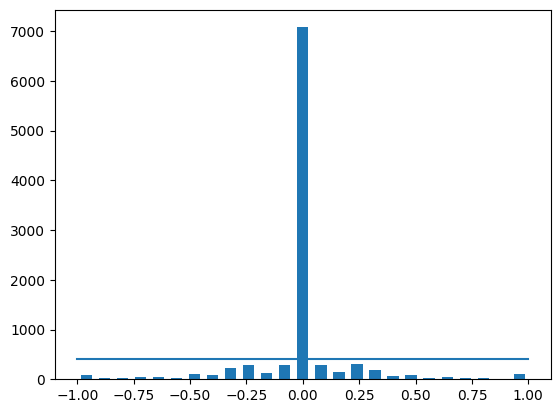

In [5]:
num_bins = 25
hist , bins = np.histogram(data["Steering"], num_bins)
center = (bins[:-1]+bins[1:])/2
plt.bar(center, hist, width =.05)
samples_per_bar = 400
plt.plot((-1,1) ,(samples_per_bar, samples_per_bar))


In [6]:
removed_data = []

print(len(data['Steering']))

for i in range(num_bins):
  list_ = []
  for j in range (len(data["Steering"])):
    if bins[i]<=data["Steering"][j] and bins[i+1] >= data["Steering"][j]:
      list_.append(j)

  list_ = shuffle(list_)
  list_ = list_[samples_per_bar:]
  removed_data.extend(list_)

data.drop(data.index[removed_data], inplace =True)
print(len(removed_data))
print(len(data['Steering']))


9800
6678
3122


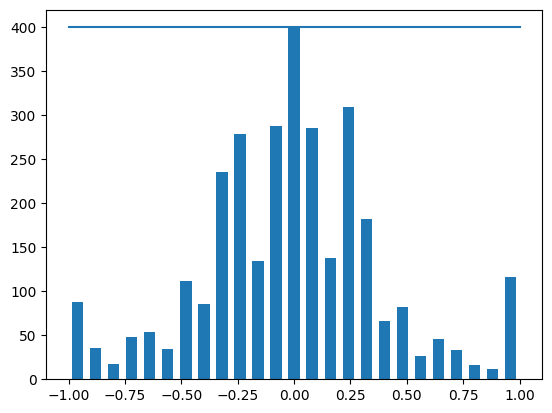

In [7]:
hist , _ = np.histogram(data['Steering'], num_bins)
plt.bar(center, hist, width = .05)
plt.plot((-1,1) ,(samples_per_bar, samples_per_bar))


In [8]:
img_paths = []
steerings = []
count =0
for i in range(len(data)):

    indexed_Data = data.iloc[i]
    center, left, right = indexed_Data[0], indexed_Data[1], indexed_Data[2]
    steering = float(indexed_Data[3])



    steerings.append(steering)
    img_paths.append("udacitySim_Behavioral_Cloning_Model/Data_collected/IMG/"+center)

    steerings.append(steering)
    img_paths.append("udacitySim_Behavioral_Cloning_Model/Data_collected/IMG/"+right)

    steerings.append(steering)
    img_paths.append("udacitySim_Behavioral_Cloning_Model/Data_collected/IMG/"+left)


img_paths = np.asarray(img_paths)
steerings = np.asarray(steerings)



/tmp/ipython-input-2225392319.py:7: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  center, left, right = indexed_Data[0], indexed_Data[1], indexed_Data[2]
/tmp/ipython-input-2225392319.py:8: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  steering = float(indexed_Data[3])


In [9]:
X_train, X_val , Y_train, Y_Val = train_test_split(img_paths, steerings, test_size=.2, random_state= 6)

Text(0.5, 1.0, 'Validation data')

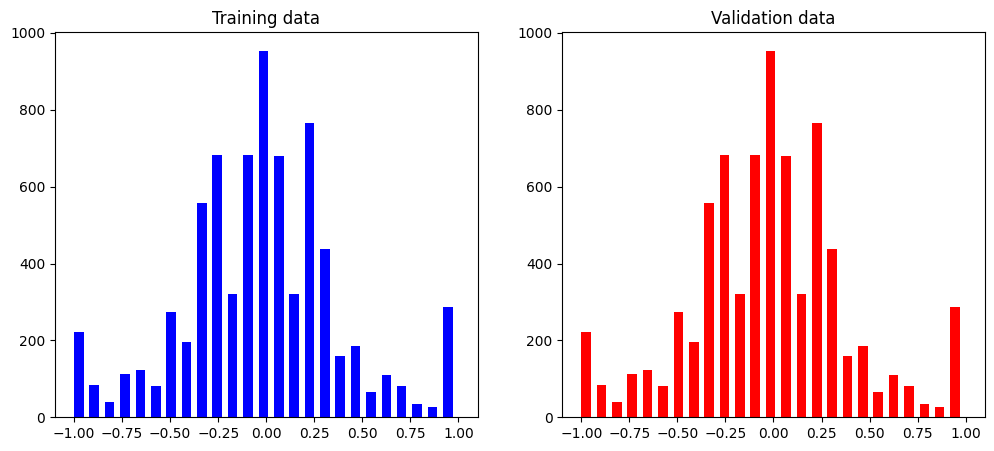

In [10]:
fig,axes = plt.subplots(1,2, figsize = (12, 5))

axes[0].hist(Y_train, num_bins, width =.05, color ="blue")
axes[0].set_title("Training data")

axes[1].hist(Y_train, num_bins, width =.05, color ="red")
axes[1].set_title("Validation data")


Text(0.5, 1.0, 'Zoomed Image')

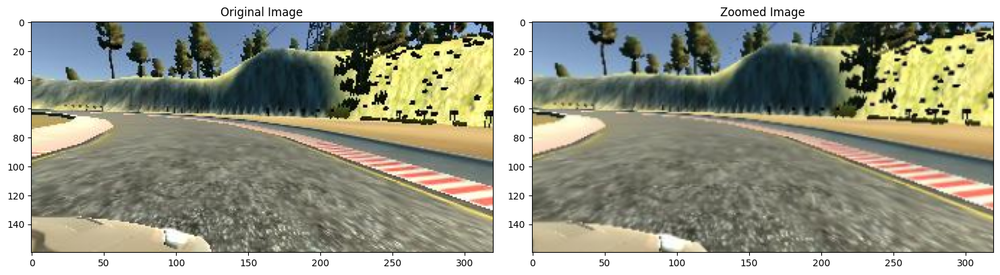

In [11]:
def zoom(image):
  zoom = iaa.Affine(scale=(1, 1.3))
  image = zoom.augment_image(image)
  return image

image = img_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
zoomed_image = zoom(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(zoomed_image)
axs[1].set_title('Zoomed Image')

Text(0.5, 1.0, 'Panned Image')

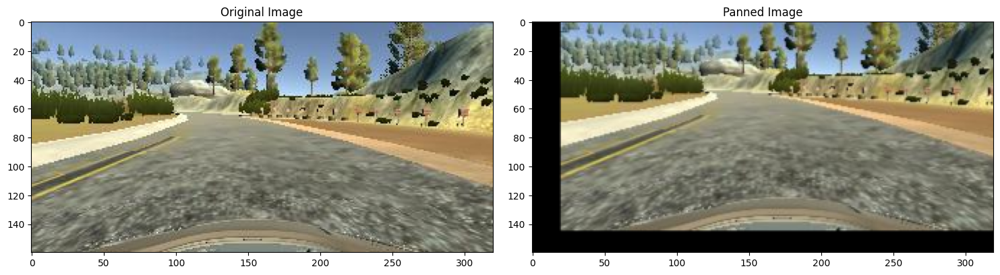

In [12]:
def pan(image):
  pan = iaa.Affine(translate_percent= {"x" : (-0.1, 0.1), "y": (-0.1, 0.1)})
  image = pan.augment_image(image)
  return image

image = img_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
panned_image = pan(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(panned_image)
axs[1].set_title('Panned Image')

Text(0.5, 1.0, 'Brightness altered image ')

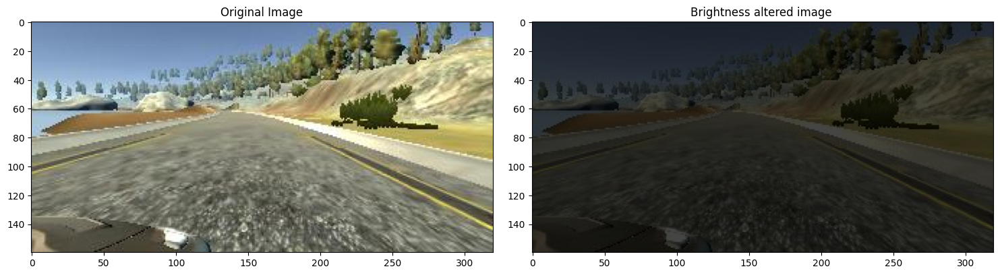

In [ ]:
def img_random_brightness(image):
    brightness = iaa.Multiply((0.2, 1.2))
    image = brightness.augment_image(image)
    return image

image = img_paths[random.randint(0, 1000)]
original_image = mpimg.imread(image)
brightness_altered_image = img_random_brightness(original_image)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image')

axs[1].imshow(brightness_altered_image)
axs[1].set_title('Brightness altered image ')

Text(0.5, 1.0, 'Flipped Image - Steering Angle:-0.0')

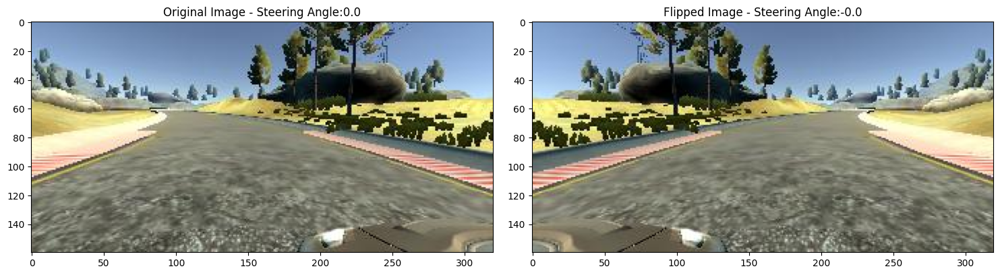

In [ ]:
def img_random_flip(image, steering_angle):
    image = cv2.flip(image,1)
    steering_angle = -steering_angle
    return image, steering_angle

random_index = random.randint(0, 1000)
image = img_paths[random_index]
steering_angle = steerings[random_index]


original_image = mpimg.imread(image)
flipped_image, flipped_steering_angle = img_random_flip(original_image, steering_angle)

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(original_image)
axs[0].set_title('Original Image - ' + 'Steering Angle:' + str(steering_angle))

axs[1].imshow(flipped_image)
axs[1].set_title('Flipped Image - ' + 'Steering Angle:' + str(flipped_steering_angle))

In [ ]:
def random_augment(image, steering_angle):
    image = mpimg.imread(image)
    if np.random.rand() < 0.5:
      image = pan(image)
    if np.random.rand() < 0.5:
      image = zoom(image)
    if np.random.rand() < 0.5:
      image = img_random_brightness(image)
    if np.random.rand() < 0.5:
      image, steering_angle = img_random_flip(image, steering_angle)
    return image, steering_angle


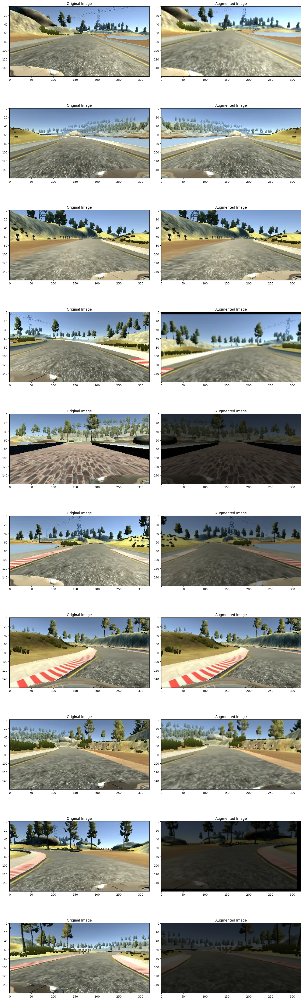

In [ ]:
ncol = 2
nrow = 10

fig, axs = plt.subplots(nrow, ncol, figsize=(15, 50))
fig.tight_layout()

for i in range(10):
  randnum = random.randint(0, len(img_paths) - 1)
  random_image = img_paths[randnum]
  random_steering = steerings[randnum]

  original_image = mpimg.imread(random_image)
  augmented_image, steering = random_augment(random_image, random_steering)

  axs[i][0].imshow(original_image)
  axs[i][0].set_title("Original Image")

  axs[i][1].imshow(augmented_image)
  axs[i][1].set_title("Augmented Image")

In [ ]:
def prepocessing_image(img):
  img = img[60:135, :, :]
  img = cv2.cvtColor(img, cv2.COLOR_RGB2YUV)
  img  = cv2.GaussianBlur(img, (3,3), 0)
  img = cv2.resize(img, (200,66))
  img = img/255
  return img

(66, 200, 3)

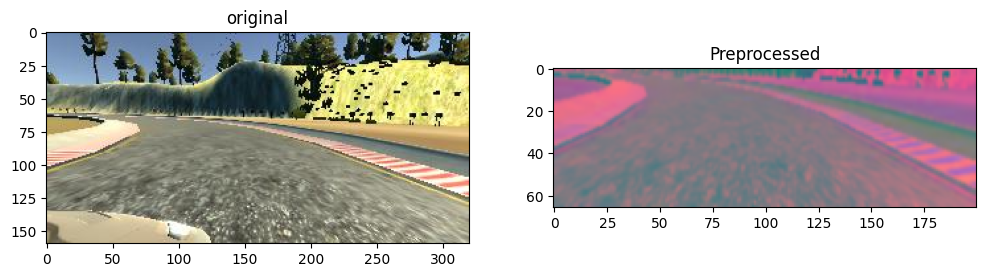

In [ ]:
img_path = img_paths[random.randint(0, len(data)-1)]
img = mpimg.imread(img_path)

preprocessed_img = prepocessing_image(img)
img = mpimg.imread(img_path)

fig, axis = plt.subplots(1,2,  figsize =(12,5))

axis[0].imshow(img)
axis[0].set_title("original")

axis[1].imshow(preprocessed_img)
axis[1].set_title("Preprocessed")

preprocessed_img.shape

In [ ]:
def batch_generator(image_paths, steering_ang, batch_size, istraining):

  while True:
    batch_img = []
    batch_steering = []

    for i in range(batch_size):
      random_index = random.randint(0, len(image_paths) - 1)

      if istraining:
        im, steering = random_augment(image_paths[random_index], steering_ang[random_index])

      else:
        im = mpimg.imread(image_paths[random_index])
        steering = steering_ang[random_index]

      im = prepocessing_image(im)
      batch_img.append(im)
      batch_steering.append(steering)
    yield (np.asarray(batch_img), np.asarray(batch_steering))

Text(0.5, 1.0, 'Validation Image')

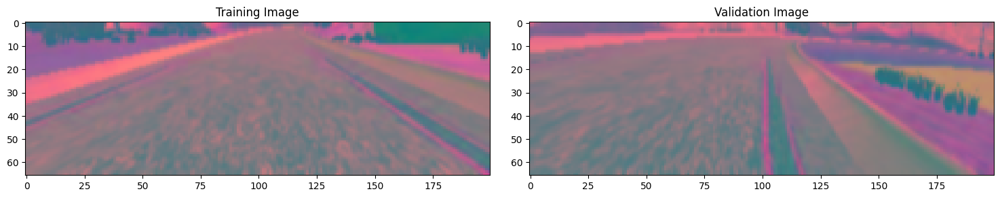

In [ ]:
x_train_gen, y_train_gen = next(batch_generator(X_train, Y_train, 1, 1))
x_valid_gen, y_valid_gen = next(batch_generator(X_val, Y_Val, 1, 0))

fig, axs = plt.subplots(1, 2, figsize=(15, 10))
fig.tight_layout()

axs[0].imshow(x_train_gen[0])
axs[0].set_title('Training Image')

axs[1].imshow(x_valid_gen[0])
axs[1].set_title('Validation Image')

In [ ]:
print(X_train.shape)
print(X_val.shape)

(7492,)
(1874,)


In [ ]:
model  = Sequential()
model.add(Input((66,200,3)))
model.add(Convolution2D(24, kernel_size=(5,5), strides=(2,2), activation="elu"))
model.add(Convolution2D(36, kernel_size=(5,5), strides=(2,2), activation="elu"))
model.add(Convolution2D(48, kernel_size=(5,5), strides=(2,2), activation="elu"))
model.add(Convolution2D(64, kernel_size=(3,3),  activation="elu"))

model.add(Convolution2D(64, kernel_size=(3,3),  activation="elu"))

model.add(Flatten())

model.add(Dense(100, activation="elu"))

model.add(Dense(50, activation="elu"))

model.add(Dense(10, activation="elu"))

model.add(Dense(1))

model.compile(Adam(learning_rate= 1e-3), loss = "mean_squared_error")



In [ ]:
model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d (Conv2D)             (None, 31, 98, 24)        1824      
                                                                 
 conv2d_1 (Conv2D)           (None, 14, 47, 36)        21636     
                                                                 
 conv2d_2 (Conv2D)           (None, 5, 22, 48)         43248     
                                                                 
 conv2d_3 (Conv2D)           (None, 3, 20, 64)         27712     
                                                                 
 conv2d_4 (Conv2D)           (None, 1, 18, 64)         36928     
                                                                 
 flatten (Flatten)           (None, 1152)              0         
                                                                 
 dense (Dense)               (None, 100)               1

In [ ]:
h =model.fit(batch_generator(X_train, Y_train, 100, 1), steps_per_epoch =  300, epochs=10,validation_data=batch_generator(X_val, Y_Val,100,0), validation_steps = 200, verbose=1, shuffle =1)

Epoch 1/10
  1/300 [..............................] - ETA: 10:12 - loss: 0.2290

KeyboardInterrupt: 

In [ ]:
plt.plot(h.history["loss"])
plt.plot(h.history["val_loss"])


In [ ]:
model.save("Behavioral_clonning_model.h5")


In [ ]:
from google.colab import files
files.download("Behavioral_clonning_model.h5")

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 58.5/58.5 kB 3.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 18.2/18.2 MB 110.0 MB/s eta 0:00:00
  Attempting uninstall: numpy
    Found existing installation: numpy 2.0.0
    Uninstalling numpy-2.0.0:
      Successfully uninstalled numpy-2.0.0
ERROR: pip's dependency resolver does not currently take into account all the packages that are installed. This behaviour is the source of the following dependency conflicts.
opencv-contrib-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.0 which is incompatible.
opencv-python-headless 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.0 which is incompatible.
thinc 8.3.6 requires numpy<3.0.0,>=2.0.0, but you have numpy 1.26.0 which is incompatible.
opencv-python 4.12.0.88 requires numpy<2.3.0,>=2; python_version >= "3.9", but you have numpy 1.26.0 which is incompatible.
